Created on October 1 2020

@author: Param Shah


In [ ]:
import tensorflow as tf
import os
import time
from matplotlib import pyplot as plt
from IPython import display
from glob import glob
from tensorflow.keras.layers import UpSampling2D, Conv2D

In [ ]:
gpus = tf.config.experimental.list_logical_devices('GPU')
gpus

[LogicalDevice(name='/device:GPU:0', device_type='GPU')]

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls '/content/drive/My Drive/maps.tar.gz'

'/content/drive/My Drive/maps.tar.gz'


In [ ]:
!tar xf  '/content/drive/My Drive/maps.tar.gz'

In [ ]:
PATH = os.listdir("maps/")
PATH

['train', 'val']

In [ ]:
BUFFER_SIZE = 400
batch_size = 1
img_W = 256
img_H = 256

**Preprocessing of the images**

In [ ]:
def preprocess(image):
  imag = tf.io.read_file(image)
  image = tf.image.decode_jpeg(imag)

  w = tf.shape(image)[1]

  #splitting the input image and the real image into 2 new images
  w = w // 2
  input_img = image[:, :w, :]
  ground_img = image[:, w:, :]

  input_img = tf.cast(input_img, tf.float32)
  ground_img = tf.cast(ground_img, tf.float32)

  return input_img, ground_img

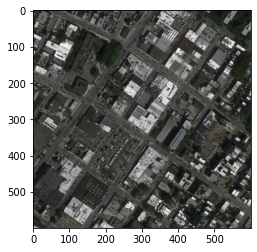

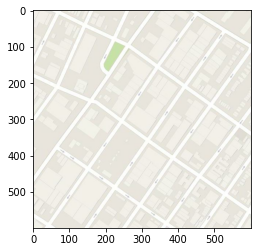

In [ ]:
inp, re = preprocess("./maps/train/10.jpg")
# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

In [ ]:
# normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

As you can see in the images below that they are going through random jittering Random jittering as described in the paper is to

1)Resize an image to bigger height and width

2)Randomly crop to the target size

3)Randomly flip the image horizontally

this is a trick to avoid overfitting

In [ ]:

def random_jitter(input_img, ground_img,img_W,img_H):
  #resize the image
  input_img = tf.image.resize(input_img, [286, 286]) #Input image
  ground_img = tf.image.resize(ground_img, [286, 286]) #Ground Truth image
  
  # randomly cropping to 256 x 256 x 3
  stacked_image = tf.stack([input_img, ground_img], axis=0)
  cropped_image = tf.image.random_crop(stacked_image, size=[2, img_H, img_W, 3])
  input_img, ground_img = cropped_image[0], cropped_image[1]

# If training => do random flip , this is a trick to avoid overfitting
  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_img = tf.image.flip_left_right(input_img)
    ground_img = tf.image.flip_left_right(ground_img)

  return input_img, ground_img


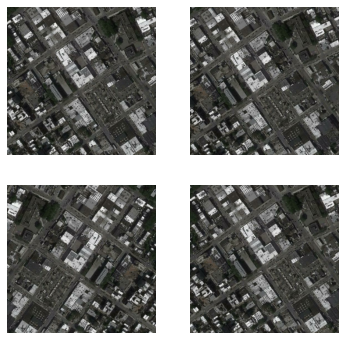

In [ ]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re,img_W,img_H)
  plt.subplot(2, 2, i+1)
  plt.imshow(rj_inp/255.0)
  plt.axis('off')
plt.show()

**loading the training and testing images**

In [ ]:
def train(image):
  input_img, ground_img = preprocess(image)
  input_img, ground_img = random_jitter(input_img, ground_img,img_W,img_H)
  input_img, ground_img = normalize(input_img, ground_img)

  return input_img, ground_img

In [ ]:
def test(image):
  input_img, ground_img = preprocess(image)
  input_img = tf.image.resize(input_img, size=[img_H, img_W],method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  ground_img = tf.image.resize(ground_img, size=[img_H,img_W],method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  input_img, ground_img = normalize(input_img, ground_img)

  return input_img, ground_img

In [ ]:
#calling the training data
train_dataset = tf.data.Dataset.list_files("maps/train/*.jpg")
train_dataset = train_dataset.map(train).shuffle(BUFFER_SIZE).batch(batch_size).cache()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
#calling the testing data
test_dataset = tf.data.Dataset.list_files("maps/val/*.jpg")
test_dataset = test_dataset.map(test).batch(batch_size)

**Generator**

In [ ]:
channels =3
gf =64

#U-NET Architecture
def conv2d(layer_input, filters, f_size=4, bn=True): #downsampling
    d = tf.keras.layers.Conv2D(filters, kernel_size=f_size, strides=2,use_bias=False, padding='same')(layer_input)
    d = tf.keras.layers.LeakyReLU()(d)
    if bn:
        d = tf.keras.layers.BatchNormalization()(d)
    return d

#Layers used during upsampling
def deconv2d(layer_input, filters, f_size=4, dropout_rate=False): #upsampling
    u = tf.keras.layers.Conv2DTranspose(filters, kernel_size=f_size, strides=2,use_bias=False, padding='same')(layer_input)
    if dropout_rate:
        u = tf.keras.layers.Dropout(0.5)(u)
    u = tf.keras.layers.BatchNormalization()(u)
    u = tf.keras.layers.LeakyReLU()(u)
    #u = tf.keras.layers.Concatenate()([u, skip_input]) #skip connection
    return u


def resnet9(layer_input,filters, f_size=3):
  x = layer_input
  #import pdb;pdb.set_trace()
  r = tf.keras.layers.Conv2D(filters, kernel_size=f_size, strides=1,use_bias=False,kernel_initializer= 'he_normal', padding='same')(layer_input)
  r = tf.keras.layers.BatchNormalization()(r)
  r = tf.keras.layers.ReLU()(r)
  r = tf.keras.layers.Conv2D(filters, kernel_size=f_size, strides=1,use_bias=False,kernel_initializer= 'he_normal' , padding='same')(r)
  r = tf.keras.layers.BatchNormalization()(r)
  r = tf.math.add(x, r)
  return r

def Generator():
    initializer = tf.random_normal_initializer(0., 0.02)
    #Layers used during downsampling
    #import pdb;pdb.set_trace()
    d0 = tf.keras.layers.Input(shape=[256,256,3])
    d = tf.keras.layers.Conv2D(64, kernel_size=7,strides=1, padding='same',kernel_initializer=initializer, use_bias=False)(d0)
    d = tf.keras.layers.BatchNormalization()(d)                                       
                                         
                                           
                                          
     # Downsampling
    d1 = conv2d(d, 128)
    d2 = conv2d(d1, 256)

    #resnet
    r1 = resnet9(d2,256)
    r2 = resnet9(r1,256)
    r3 = resnet9(r2,256)
    r4 = resnet9(r3,256)
    r5 = resnet9(r4,256)
    r6 = resnet9(r5,256)
    r7 = resnet9(r6,256)
    r8 = resnet9(r7,256)
    r9 = resnet9(r8,256)


    # Upsampling
    u1 = deconv2d(r8,128)
    u2 = deconv2d(u1,64)

    output_img = tf.keras.layers.Conv2D(channels, kernel_size=7, strides=1, kernel_initializer=initializer,padding='same',activation='tanh')(u2)

    model= tf.keras.Model(d0, output_img)
    if len(gpus)>1:
        return tf.keras.utils.multi_gpu_model(model, gpus=len(gpus), cpu_merge=True, cpu_relocation=False)
    else:
        return model

In [ ]:
generator = Generator()
#tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

**Generator loss**

In [ ]:
Lambda = 100
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(disc_generated_output), disc_generated_output)
  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
 
  total_gen_loss = gan_loss + (Lambda * l1_loss)
 
  return total_gen_loss, gan_loss, l1_loss

**Discriminator**

In [ ]:
df=64
 
#Patch GAN Architecture
def d_layer(layer_input, filters, f_size=4, bn=True):
    d = tf.keras.layers.Conv2D(filters, kernel_size=f_size, strides=2,use_bias=False, padding='same')(layer_input)
    d = tf.keras.layers.LeakyReLU()(d)
    if bn:
        d = tf.keras.layers.BatchNormalization()(d)
    return d
def Discriminator():
        initializer = tf.random_normal_initializer(0., 0.02)
        img_A = tf.keras.layers.Input(shape=[256, 256, 3])
        img_B = tf.keras.layers.Input(shape=[256, 256, 3])
 
        combined_imgs = tf.keras.layers.Concatenate(axis=-1)([img_A, img_B])
 
        d1 = d_layer(combined_imgs, df, bn=False)
        d2 = d_layer(d1, df*2)
        d3 = d_layer(d2, df*4)
        zero_pad1 = tf.keras.layers.ZeroPadding2D()(d3)
        conv = tf.keras.layers.Conv2D(512, 4, strides=1,kernel_initializer=initializer,use_bias=False)(zero_pad1) 
 
        batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
 
        leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)
 
        zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)
 
        validity = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) 
 
        model = tf.keras.Model([img_A, img_B], validity)
        if len(gpus)>1:
            return tf.keras.utils.multi_gpu_model(model, gpus=len(gpus), cpu_merge=True, cpu_relocation=False)
        else:
            return model

In [ ]:
discriminator = Discriminator()
#tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

**Discriminator loss**

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)



In [ ]:
def generate_images(model, test_input, tar,epoch,save_or_not =True):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

loss upgradation using sgd

In [ ]:
def train_step(input_image, target, g_loss_metric, d_loss_metric):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  g_loss_metric.update_state(gen_total_loss)
  d_loss_metric.update_state(disc_loss)
  
  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

print("starting training")


starting training


In [ ]:
for i ,(input ,target )in enumerate(test_dataset.take(1)):
  inp =input
  tar =target
  break

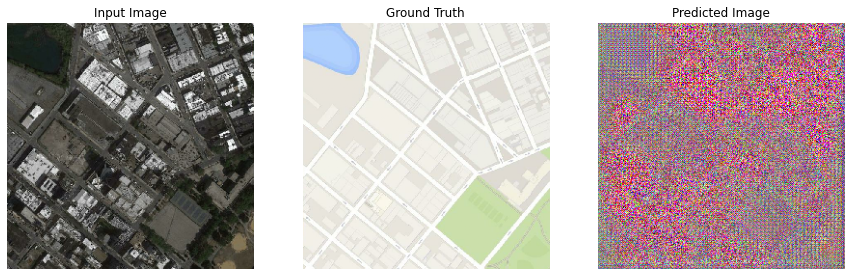

In [ ]:
generate_images(generator, inp, tar,1)

**Running the model for 150 epochs**

Epoch:  0
  loss (g) (d) (g+d):     14.098, 1.061, 15.158


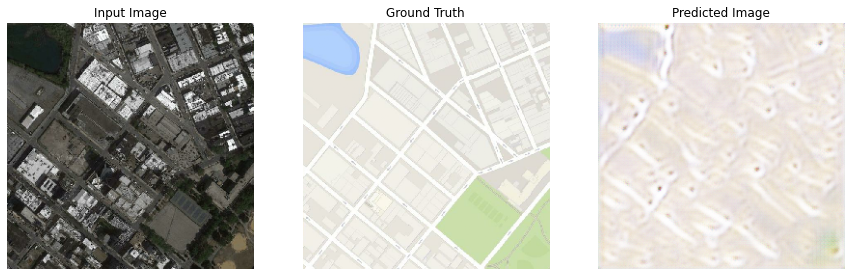

Time taken for epoch 0 is 190.71810507774353 sec

Epoch:  1
  loss (g) (d) (g+d):     12.530, 0.918, 13.448
Time taken for epoch 1 is 188.4965808391571 sec

Epoch:  2
  loss (g) (d) (g+d):     12.041, 0.889, 12.929
Time taken for epoch 2 is 187.95932269096375 sec

Epoch:  3
  loss (g) (d) (g+d):     11.245, 0.905, 12.149
Time taken for epoch 3 is 187.94923758506775 sec

Epoch:  4
  loss (g) (d) (g+d):     11.080, 0.856, 11.936
Time taken for epoch 4 is 187.87232995033264 sec

Epoch:  5
  loss (g) (d) (g+d):     10.602, 0.836, 11.438


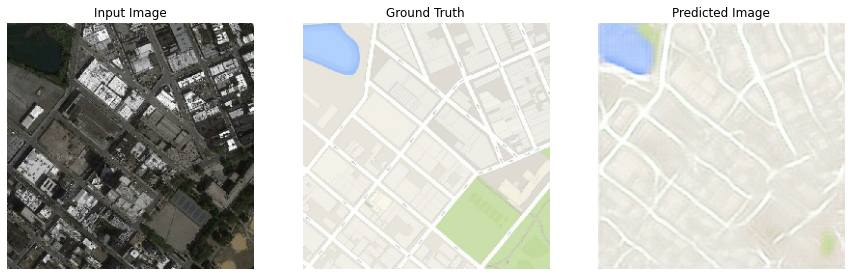

Time taken for epoch 5 is 188.28142523765564 sec

Epoch:  6
  loss (g) (d) (g+d):     10.413, 0.817, 11.231
Time taken for epoch 6 is 187.8436312675476 sec

Epoch:  7
  loss (g) (d) (g+d):     9.988, 0.877, 10.865
Time taken for epoch 7 is 187.8408443927765 sec

Epoch:  8
  loss (g) (d) (g+d):     9.723, 0.899, 10.622
Time taken for epoch 8 is 187.8074758052826 sec

Epoch:  9
  loss (g) (d) (g+d):     9.592, 0.882, 10.474
Time taken for epoch 9 is 187.94261741638184 sec

Epoch:  10
  loss (g) (d) (g+d):     9.530, 0.882, 10.412


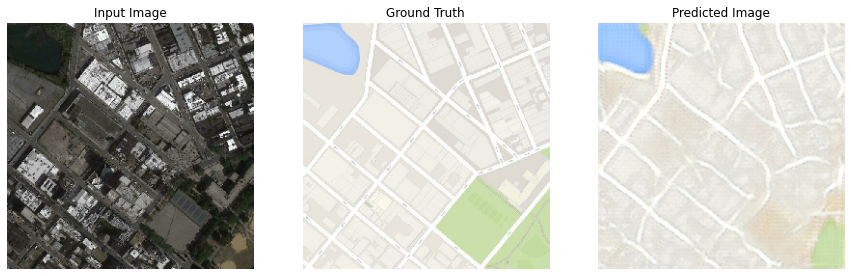

Time taken for epoch 10 is 188.1003978252411 sec

Epoch:  11
  loss (g) (d) (g+d):     9.679, 0.851, 10.530
Time taken for epoch 11 is 187.88066744804382 sec

Epoch:  12
  loss (g) (d) (g+d):     9.342, 0.862, 10.204
Time taken for epoch 12 is 187.9559998512268 sec

Epoch:  13
  loss (g) (d) (g+d):     9.589, 0.810, 10.399
Time taken for epoch 13 is 187.80582523345947 sec

Epoch:  14
  loss (g) (d) (g+d):     9.435, 0.806, 10.242
Time taken for epoch 14 is 188.03049635887146 sec

Epoch:  15
  loss (g) (d) (g+d):     9.200, 0.827, 10.027


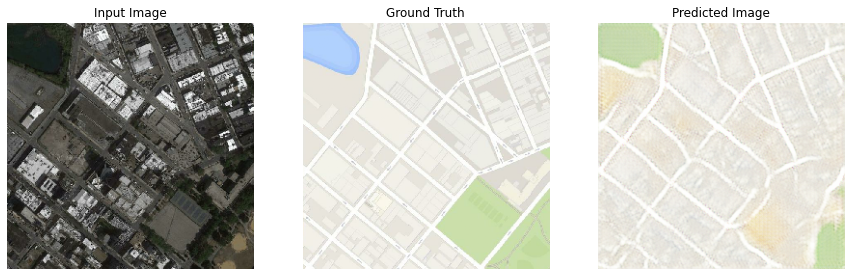

Time taken for epoch 15 is 188.14088892936707 sec

Epoch:  16
  loss (g) (d) (g+d):     9.454, 0.769, 10.224
Time taken for epoch 16 is 188.2432885169983 sec

Epoch:  17
  loss (g) (d) (g+d):     9.395, 0.772, 10.167
Time taken for epoch 17 is 187.89182353019714 sec

Epoch:  18
  loss (g) (d) (g+d):     9.259, 0.773, 10.032
Time taken for epoch 18 is 187.8925940990448 sec

Epoch:  19
  loss (g) (d) (g+d):     10.023, 0.695, 10.718
Time taken for epoch 19 is 188.64275360107422 sec

Epoch:  20
  loss (g) (d) (g+d):     9.537, 0.749, 10.286


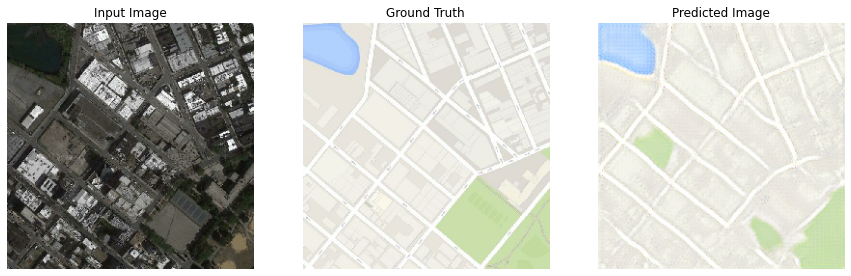

Time taken for epoch 20 is 188.28973507881165 sec

Epoch:  21
  loss (g) (d) (g+d):     9.464, 0.716, 10.180
Time taken for epoch 21 is 188.31947231292725 sec

Epoch:  22
  loss (g) (d) (g+d):     9.235, 0.733, 9.968
Time taken for epoch 22 is 187.92366075515747 sec

Epoch:  23
  loss (g) (d) (g+d):     9.648, 0.699, 10.347
Time taken for epoch 23 is 187.82964634895325 sec

Epoch:  24
  loss (g) (d) (g+d):     9.332, 0.704, 10.036
Time taken for epoch 24 is 187.9757843017578 sec

Epoch:  25
  loss (g) (d) (g+d):     9.455, 0.690, 10.146


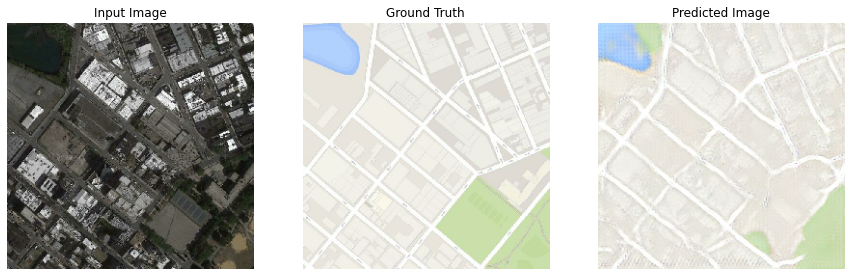

Time taken for epoch 25 is 188.2379994392395 sec

Epoch:  26
  loss (g) (d) (g+d):     9.895, 0.633, 10.528
Time taken for epoch 26 is 187.8513696193695 sec

Epoch:  27
  loss (g) (d) (g+d):     9.571, 0.621, 10.192
Time taken for epoch 27 is 187.81679487228394 sec

Epoch:  28
  loss (g) (d) (g+d):     9.614, 0.667, 10.281
Time taken for epoch 28 is 187.77745366096497 sec

Epoch:  29
  loss (g) (d) (g+d):     9.908, 0.606, 10.514
Time taken for epoch 29 is 187.81196928024292 sec

Epoch:  30
  loss (g) (d) (g+d):     9.580, 0.667, 10.247


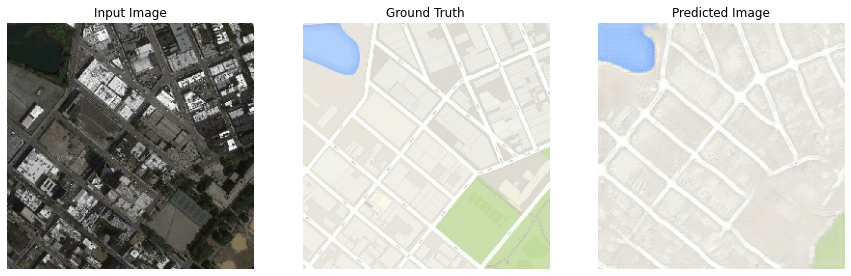

Time taken for epoch 30 is 188.03826642036438 sec

Epoch:  31
  loss (g) (d) (g+d):     9.515, 0.621, 10.136
Time taken for epoch 31 is 187.93165683746338 sec

Epoch:  32
  loss (g) (d) (g+d):     9.512, 0.676, 10.188
Time taken for epoch 32 is 187.60958194732666 sec

Epoch:  33
  loss (g) (d) (g+d):     9.412, 0.647, 10.059
Time taken for epoch 33 is 187.83270263671875 sec

Epoch:  34
  loss (g) (d) (g+d):     9.586, 0.617, 10.202
Time taken for epoch 34 is 187.5239326953888 sec

Epoch:  35
  loss (g) (d) (g+d):     9.811, 0.606, 10.417


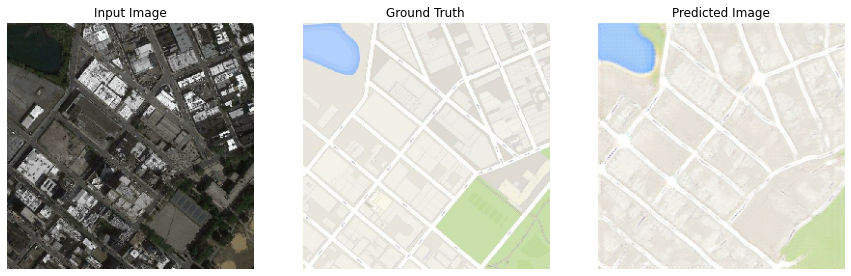

Time taken for epoch 35 is 188.0811243057251 sec

Epoch:  36
  loss (g) (d) (g+d):     9.590, 0.627, 10.217
Time taken for epoch 36 is 188.15502047538757 sec

Epoch:  37
  loss (g) (d) (g+d):     9.499, 0.631, 10.130
Time taken for epoch 37 is 187.75778245925903 sec

Epoch:  38
  loss (g) (d) (g+d):     9.546, 0.615, 10.160
Time taken for epoch 38 is 187.85537004470825 sec

Epoch:  39
  loss (g) (d) (g+d):     9.556, 0.622, 10.178
Time taken for epoch 39 is 188.36937952041626 sec

Epoch:  40
  loss (g) (d) (g+d):     10.087, 0.544, 10.631


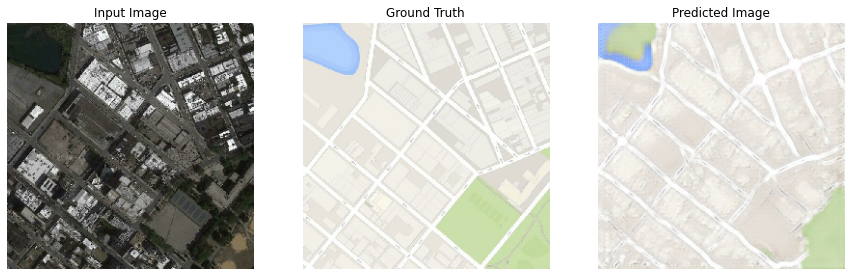

Time taken for epoch 40 is 188.2318675518036 sec

Epoch:  41
  loss (g) (d) (g+d):     9.604, 0.657, 10.261
Time taken for epoch 41 is 188.15781831741333 sec

Epoch:  42
  loss (g) (d) (g+d):     9.928, 0.520, 10.448
Time taken for epoch 42 is 187.89580011367798 sec

Epoch:  43
  loss (g) (d) (g+d):     9.578, 0.631, 10.209
Time taken for epoch 43 is 188.0211455821991 sec

Epoch:  44
  loss (g) (d) (g+d):     9.532, 0.611, 10.143
Time taken for epoch 44 is 187.99616074562073 sec

Epoch:  45
  loss (g) (d) (g+d):     9.806, 0.549, 10.355


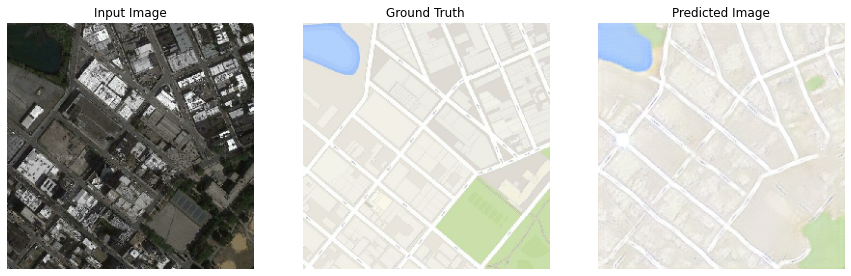

Time taken for epoch 45 is 188.40029907226562 sec

Epoch:  46
  loss (g) (d) (g+d):     9.570, 0.606, 10.176
Time taken for epoch 46 is 188.08114981651306 sec

Epoch:  47
  loss (g) (d) (g+d):     9.686, 0.575, 10.261
Time taken for epoch 47 is 188.0521445274353 sec

Epoch:  48
  loss (g) (d) (g+d):     9.671, 0.620, 10.291
Time taken for epoch 48 is 187.91308879852295 sec

Epoch:  49
  loss (g) (d) (g+d):     9.563, 0.556, 10.118
Time taken for epoch 49 is 187.9587140083313 sec

Epoch:  50
  loss (g) (d) (g+d):     10.026, 0.542, 10.568


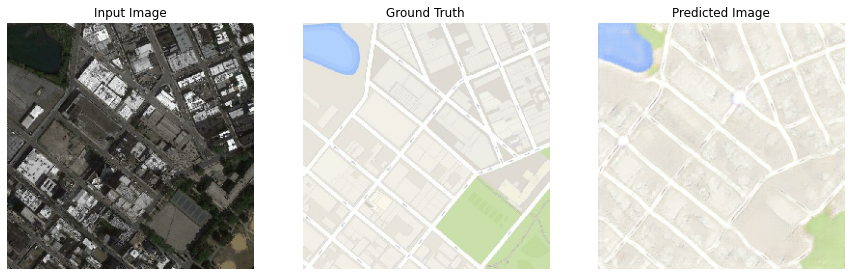

Time taken for epoch 50 is 188.39694714546204 sec

Epoch:  51
  loss (g) (d) (g+d):     9.705, 0.547, 10.251
Time taken for epoch 51 is 188.12331819534302 sec

Epoch:  52
  loss (g) (d) (g+d):     9.611, 0.575, 10.186
Time taken for epoch 52 is 187.62034010887146 sec

Epoch:  53
  loss (g) (d) (g+d):     9.953, 0.503, 10.455
Time taken for epoch 53 is 187.69473123550415 sec

Epoch:  54
  loss (g) (d) (g+d):     10.488, 0.462, 10.950
Time taken for epoch 54 is 187.81307339668274 sec

Epoch:  55
  loss (g) (d) (g+d):     9.992, 0.554, 10.546


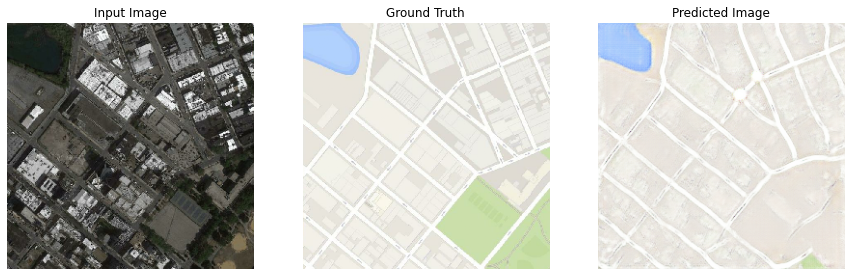

Time taken for epoch 55 is 187.77670168876648 sec

Epoch:  56
  loss (g) (d) (g+d):     10.575, 0.471, 11.046
Time taken for epoch 56 is 187.74037718772888 sec

Epoch:  57
  loss (g) (d) (g+d):     10.240, 0.479, 10.719
Time taken for epoch 57 is 187.4852511882782 sec

Epoch:  58
  loss (g) (d) (g+d):     9.779, 0.587, 10.366
Time taken for epoch 58 is 187.5519802570343 sec

Epoch:  59
  loss (g) (d) (g+d):     9.698, 0.502, 10.200
Time taken for epoch 59 is 187.82353281974792 sec

Epoch:  60
  loss (g) (d) (g+d):     10.259, 0.489, 10.749


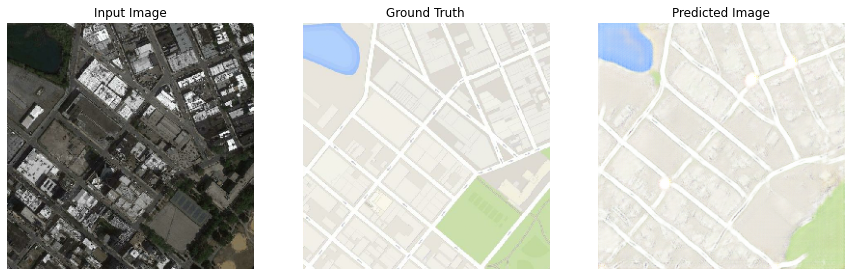

Time taken for epoch 60 is 187.75421166419983 sec

Epoch:  61
  loss (g) (d) (g+d):     10.800, 0.412, 11.212
Time taken for epoch 61 is 187.8438241481781 sec

Epoch:  62
  loss (g) (d) (g+d):     9.738, 0.578, 10.316
Time taken for epoch 62 is 187.56346249580383 sec

Epoch:  63
  loss (g) (d) (g+d):     9.578, 0.546, 10.124
Time taken for epoch 63 is 187.60785913467407 sec

Epoch:  64
  loss (g) (d) (g+d):     9.913, 0.507, 10.419
Time taken for epoch 64 is 187.80685830116272 sec

Epoch:  65
  loss (g) (d) (g+d):     9.921, 0.490, 10.411


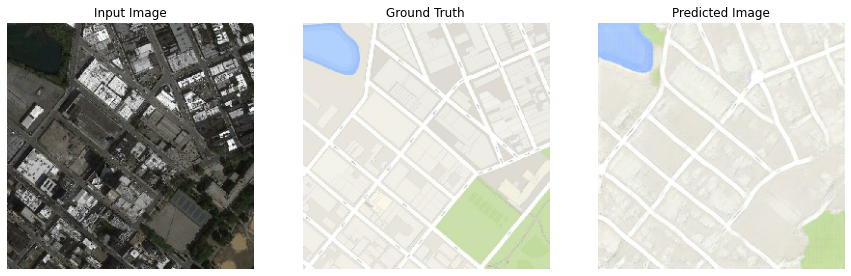

Time taken for epoch 65 is 187.9412317276001 sec

Epoch:  66
  loss (g) (d) (g+d):     9.910, 0.458, 10.368
Time taken for epoch 66 is 188.12299823760986 sec

Epoch:  67
  loss (g) (d) (g+d):     9.763, 0.562, 10.325
Time taken for epoch 67 is 187.62760972976685 sec

Epoch:  68
  loss (g) (d) (g+d):     10.174, 0.459, 10.633
Time taken for epoch 68 is 187.39318680763245 sec

Epoch:  69
  loss (g) (d) (g+d):     9.727, 0.491, 10.218
Time taken for epoch 69 is 187.72487568855286 sec

Epoch:  70
  loss (g) (d) (g+d):     9.863, 0.503, 10.365


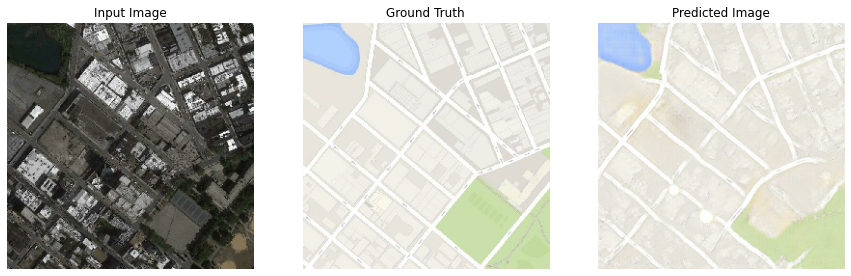

Time taken for epoch 70 is 187.76326942443848 sec

Epoch:  71
  loss (g) (d) (g+d):     9.560, 0.543, 10.103
Time taken for epoch 71 is 187.70286440849304 sec

Epoch:  72
  loss (g) (d) (g+d):     9.731, 0.486, 10.217
Time taken for epoch 72 is 187.66418743133545 sec

Epoch:  73
  loss (g) (d) (g+d):     9.874, 0.457, 10.331
Time taken for epoch 73 is 187.54227662086487 sec

Epoch:  74
  loss (g) (d) (g+d):     9.643, 0.579, 10.222
Time taken for epoch 74 is 187.76085805892944 sec

Epoch:  75
  loss (g) (d) (g+d):     10.024, 0.447, 10.472


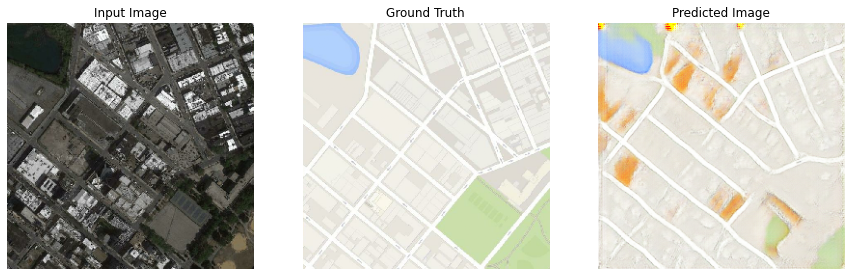

Time taken for epoch 75 is 187.99103426933289 sec

Epoch:  76
  loss (g) (d) (g+d):     10.984, 0.293, 11.276
Time taken for epoch 76 is 187.67811274528503 sec

Epoch:  77
  loss (g) (d) (g+d):     10.390, 0.558, 10.948
Time taken for epoch 77 is 187.70610785484314 sec

Epoch:  78
  loss (g) (d) (g+d):     9.518, 0.523, 10.041
Time taken for epoch 78 is 187.62014484405518 sec

Epoch:  79
  loss (g) (d) (g+d):     9.803, 0.471, 10.274
Time taken for epoch 79 is 187.94803285598755 sec

Epoch:  80
  loss (g) (d) (g+d):     9.618, 0.492, 10.110


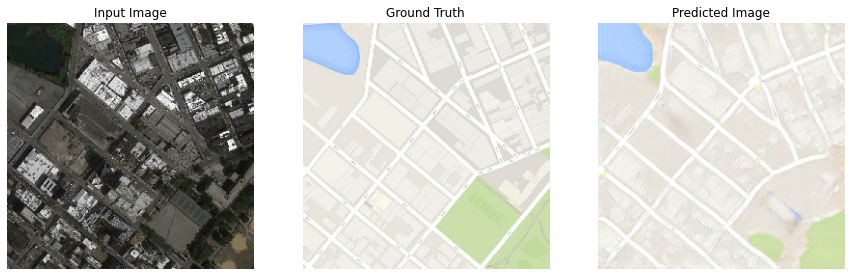

Time taken for epoch 80 is 187.8759744167328 sec

Epoch:  81
  loss (g) (d) (g+d):     9.779, 0.470, 10.249
Time taken for epoch 81 is 187.69875645637512 sec

Epoch:  82
  loss (g) (d) (g+d):     10.396, 0.381, 10.777
Time taken for epoch 82 is 187.67493891716003 sec

Epoch:  83
  loss (g) (d) (g+d):     9.474, 0.571, 10.045
Time taken for epoch 83 is 187.68989181518555 sec

Epoch:  84
  loss (g) (d) (g+d):     10.392, 0.372, 10.763
Time taken for epoch 84 is 187.59442353248596 sec

Epoch:  85
  loss (g) (d) (g+d):     9.858, 0.512, 10.370


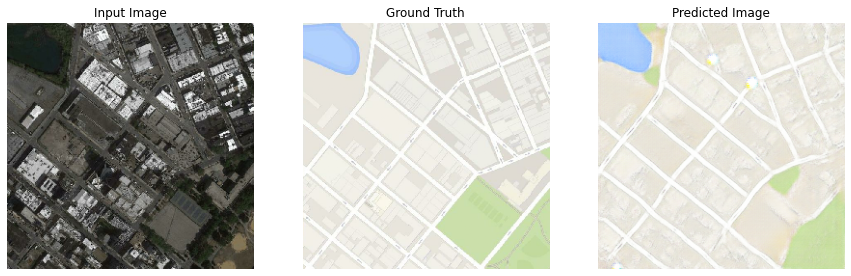

Time taken for epoch 85 is 187.973717212677 sec

Epoch:  86
  loss (g) (d) (g+d):     9.632, 0.466, 10.099
Time taken for epoch 86 is 187.8582260608673 sec

Epoch:  87
  loss (g) (d) (g+d):     9.675, 0.471, 10.146
Time taken for epoch 87 is 187.72051548957825 sec

Epoch:  88
  loss (g) (d) (g+d):     9.697, 0.513, 10.211
Time taken for epoch 88 is 187.58688473701477 sec

Epoch:  89
  loss (g) (d) (g+d):     10.911, 0.343, 11.255
Time taken for epoch 89 is 187.74740719795227 sec

Epoch:  90
  loss (g) (d) (g+d):     9.976, 0.481, 10.456


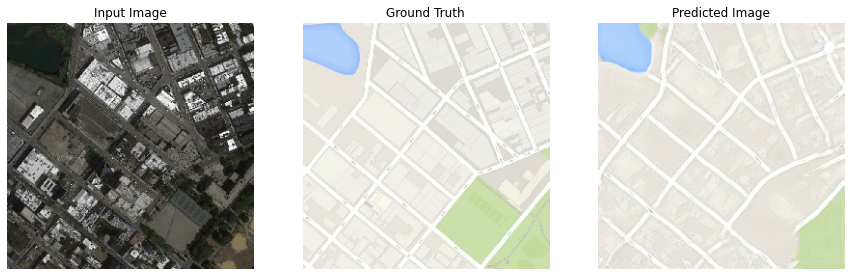

Time taken for epoch 90 is 187.73343682289124 sec

Epoch:  91
  loss (g) (d) (g+d):     9.775, 0.455, 10.230
Time taken for epoch 91 is 187.67480731010437 sec

Epoch:  92
  loss (g) (d) (g+d):     9.547, 0.524, 10.072
Time taken for epoch 92 is 187.6805989742279 sec

Epoch:  93
  loss (g) (d) (g+d):     10.408, 0.369, 10.777
Time taken for epoch 93 is 187.5909285545349 sec

Epoch:  94
  loss (g) (d) (g+d):     10.957, 0.392, 11.349
Time taken for epoch 94 is 187.64466285705566 sec

Epoch:  95
  loss (g) (d) (g+d):     9.463, 0.595, 10.058


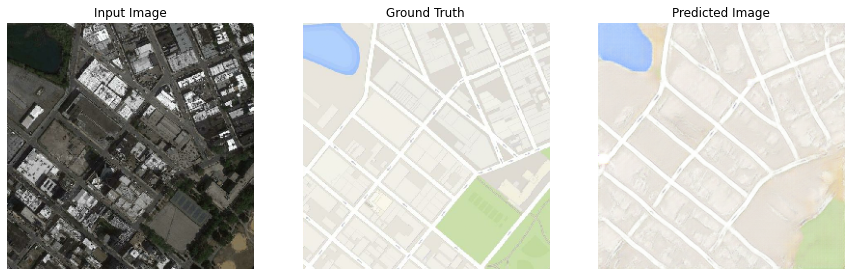

Time taken for epoch 95 is 187.978342294693 sec

Epoch:  96
  loss (g) (d) (g+d):     9.570, 0.465, 10.035
Time taken for epoch 96 is 187.59609532356262 sec

Epoch:  97
  loss (g) (d) (g+d):     9.449, 0.525, 9.974
Time taken for epoch 97 is 187.7164912223816 sec

Epoch:  98
  loss (g) (d) (g+d):     9.432, 0.521, 9.953
Time taken for epoch 98 is 187.69407892227173 sec

Epoch:  99
  loss (g) (d) (g+d):     9.151, 0.606, 9.758
Time taken for epoch 99 is 188.1392080783844 sec

Epoch:  100
  loss (g) (d) (g+d):     9.565, 0.470, 10.034


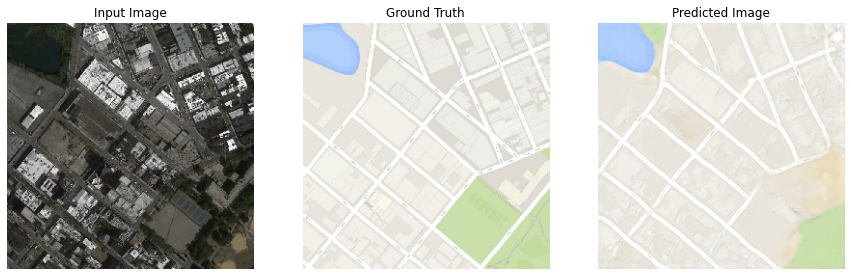

Time taken for epoch 100 is 188.27240896224976 sec

Epoch:  101
  loss (g) (d) (g+d):     9.129, 0.560, 9.689
Time taken for epoch 101 is 187.7877380847931 sec

Epoch:  102
  loss (g) (d) (g+d):     9.428, 0.502, 9.929
Time taken for epoch 102 is 187.6394124031067 sec

Epoch:  103
  loss (g) (d) (g+d):     9.166, 0.548, 9.714
Time taken for epoch 103 is 187.5255835056305 sec

Epoch:  104
  loss (g) (d) (g+d):     9.011, 0.587, 9.598
Time taken for epoch 104 is 187.49227690696716 sec

Epoch:  105
  loss (g) (d) (g+d):     9.125, 0.518, 9.643


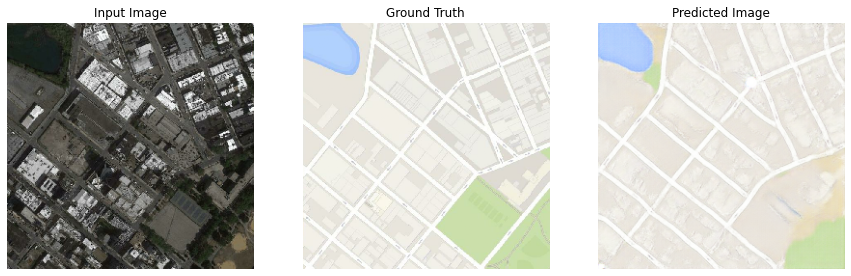

Time taken for epoch 105 is 187.85335445404053 sec

Epoch:  106
  loss (g) (d) (g+d):     9.089, 0.532, 9.620
Time taken for epoch 106 is 187.6651906967163 sec

Epoch:  107
  loss (g) (d) (g+d):     9.400, 0.472, 9.872
Time taken for epoch 107 is 187.61457538604736 sec

Epoch:  108
  loss (g) (d) (g+d):     9.218, 0.515, 9.733
Time taken for epoch 108 is 187.99242734909058 sec

Epoch:  109
  loss (g) (d) (g+d):     9.146, 0.517, 9.663
Time taken for epoch 109 is 187.8383822441101 sec

Epoch:  110
  loss (g) (d) (g+d):     9.420, 0.466, 9.885


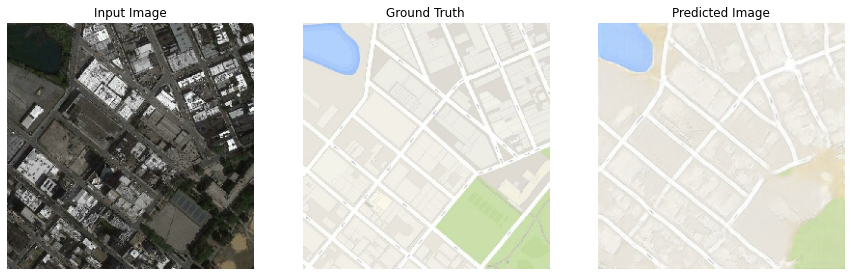

Time taken for epoch 110 is 188.09945511817932 sec

Epoch:  111
  loss (g) (d) (g+d):     9.261, 0.550, 9.811
Time taken for epoch 111 is 187.83154487609863 sec

Epoch:  112
  loss (g) (d) (g+d):     9.055, 0.539, 9.594
Time taken for epoch 112 is 187.81117701530457 sec

Epoch:  113
  loss (g) (d) (g+d):     8.830, 0.621, 9.451
Time taken for epoch 113 is 187.53555607795715 sec

Epoch:  114
  loss (g) (d) (g+d):     8.969, 0.521, 9.490
Time taken for epoch 114 is 187.5468897819519 sec

Epoch:  115
  loss (g) (d) (g+d):     8.994, 0.536, 9.530


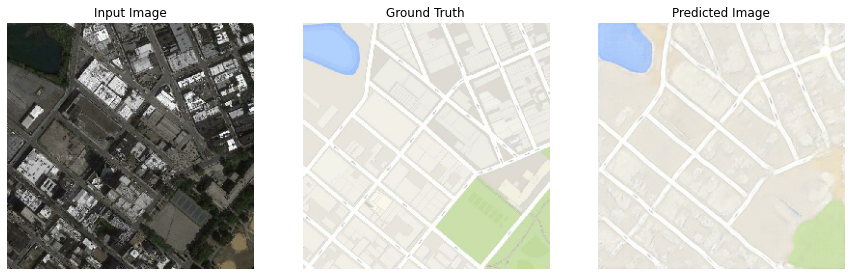

Time taken for epoch 115 is 187.89593267440796 sec

Epoch:  116
  loss (g) (d) (g+d):     8.714, 0.643, 9.357
Time taken for epoch 116 is 187.76551032066345 sec

Epoch:  117
  loss (g) (d) (g+d):     8.726, 0.598, 9.324
Time taken for epoch 117 is 187.5227813720703 sec

Epoch:  118
  loss (g) (d) (g+d):     8.754, 0.594, 9.349
Time taken for epoch 118 is 187.55745935440063 sec

Epoch:  119
  loss (g) (d) (g+d):     8.611, 0.605, 9.217
Time taken for epoch 119 is 187.9471595287323 sec



In [ ]:
epochs=150
g_loss_log = []
d_loss_log = []
g_loss_metric = tf.keras.metrics.Mean(name='g_train_loss')
d_loss_metric = tf.keras.metrics.Mean(name='d_train_loss')

for epoch in range(epochs):
  start = time.time()
  # Reset the metrics
  g_loss_metric.reset_states()
  d_loss_metric.reset_states()

  for input_image, target in train_dataset:
    train_step(input_image, target, g_loss_metric, d_loss_metric)

  # Get the metric results
  g_mean_loss = g_loss_metric.result()
  d_mean_loss = d_loss_metric.result()
  g_loss_log.append([g_mean_loss])
  d_loss_log.append([d_mean_loss])

  print('Epoch: ', epoch)
  print('  loss (g) (d) (g+d):     {:.3f}, {:.3f}, {:.3f}'.format(g_mean_loss, d_mean_loss, g_mean_loss + d_mean_loss))
  #displaying an image on the testing data set for rvery 5 epochs
  if epoch%5==0:
    generate_images(generator, inp, tar,epoch)
  

  # saving (checkpoint) the model every 20 epochs
  if (epoch + 1) % 20 == 0:
    checkpoint.save(file_prefix = checkpoint_prefix)
  print('Time taken for epoch {} is {} sec\n'.format(epoch,time.time()-start))

In [ ]:
def plot_loss(g_loss, d_loss,type_='generator'):
    """Plot the losses each epoc during training."""
    total_loss = [g[0].numpy() + d[0].numpy() for g, d in zip(g_loss, d_loss)]
    g_loss = [g[0].numpy() for g in g_loss]
    d_loss = [d[0].numpy() for d in d_loss]
    plt.figure(figsize=(10,5))
    plt.plot(g_loss, label=type_+' generator loss')
    plt.plot(d_loss, label=type_+' discriminator loss')
    plt.plot(total_loss, label='total loss')
    plt.legend()
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.title('training loss')

**Generative and Discriminator loss for training**

In [ ]:
plot_loss(g_loss_log, d_loss_log,'generator')

In [ ]:
def plot_loss(g_loss, d_loss,type_='discriminator'):
    """Plot the losses each epoc during training."""
    #total_loss = [g[0].numpy() + d[0].numpy() for g, d in zip(g_loss, d_loss)]
   # g_loss = [g[0].numpy() for g in g_loss]
    d_loss = [d[0].numpy() for d in d_loss]
    plt.figure(figsize=(10,5))
    #plt.plot(g_loss, label=type_+' generator loss')
    plt.plot(d_loss, label='resnet'_+' discriminator loss')
   # plt.plot(total_loss, label='total loss')
    plt.legend()
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.title('training loss')

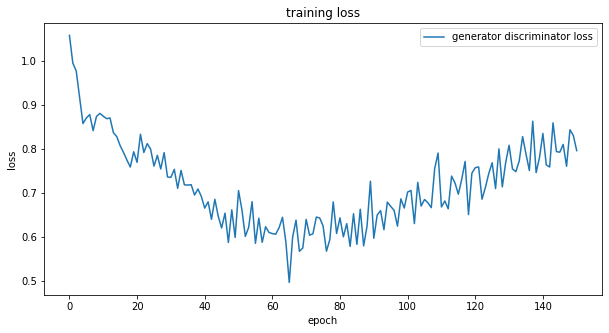

In [ ]:
plot_loss(g_loss_log, d_loss_log,'discriminator')

In [ ]:
def plot_loss(g_loss, d_loss,type_='generator'):
    """Plot the losses each epoc during training."""
    #total_loss = [g[0].numpy() + d[0].numpy() for g, d in zip(g_loss, d_loss)]
    g_loss = [g[0].numpy() for g in g_loss]
    #d_loss = [d[0].numpy() for d in d_loss]
    plt.figure(figsize=(10,5))
    plt.plot(g_loss, label='resnet_generator loss')
    #plt.plot(d_loss, label=type_+' discriminator loss')
   # plt.plot(total_loss, label='total loss')
    plt.legend()
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.title('training loss')

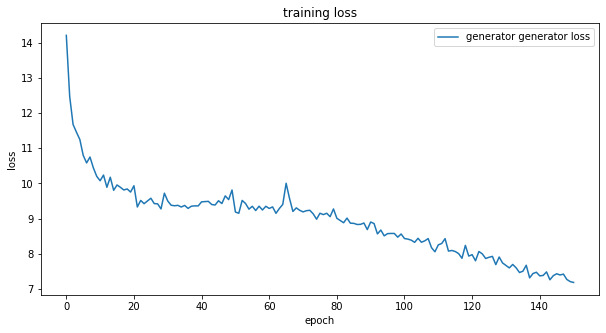

In [ ]:
plot_loss(g_loss_log, d_loss_log,'generator')

testing dataset evaluation

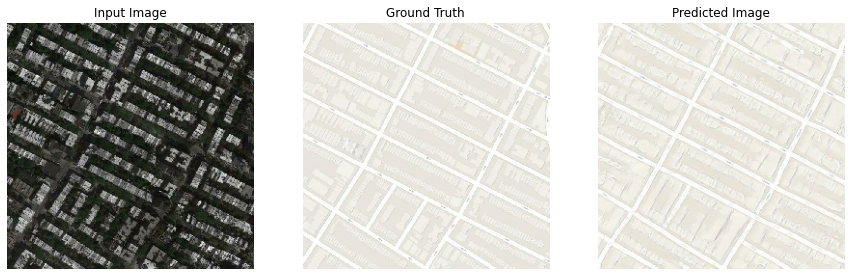

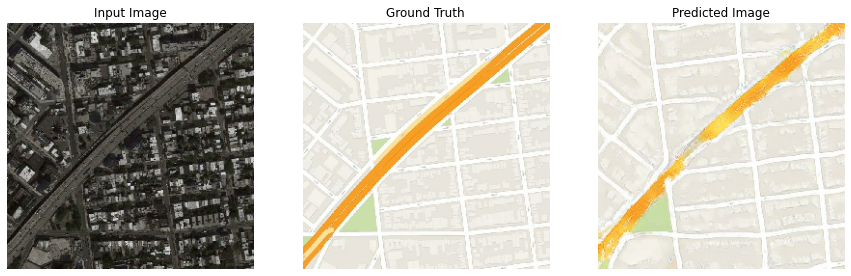

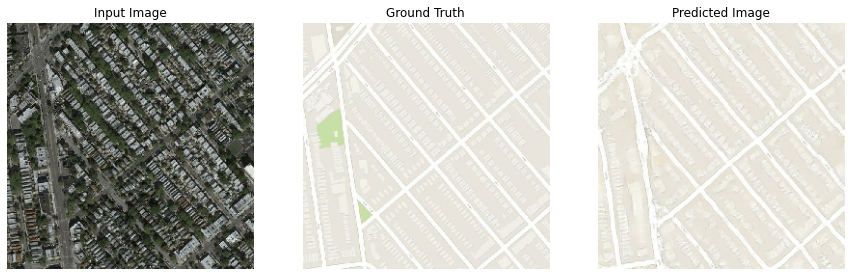

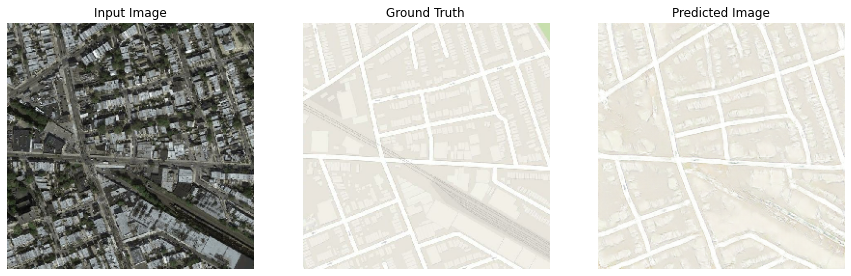

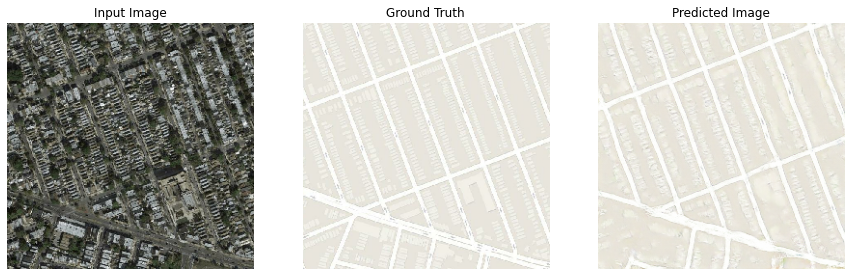

In [ ]:
# Run the trained model on a few examples from the test dataset
inp, tar in test("./maps/val/100.jpg")
generate_images(generator, inp, tar,1000,0)

In [ ]:
# Run the trained model on a few examples from the test dataset
inp, tar in test("./maps/val/1000.jpg")
generate_images(generator, inp, tar,1000,0)

In [ ]:
# Run the trained model on a few examples from the test dataset
inp, tar in test("./maps/val/1001.jpg")
generate_images(generator, inp, tar,1000,0)

In [ ]:
# Run the trained model on a few examples from the test dataset
inp, tar in test("./maps/val/1002.jpg")
generate_images(generator, inp, tar,1000,0)

In [ ]:
# Run the trained model on a few examples from the test dataset
inp, tar in test("./maps/val/1003.jpg")
generate_images(generator, inp, tar,1000,0)

In [ ]:
avg_mse = 0
it = 0
  
for input_image , target in test_dataset:
    it += 1
    gen_output = generator(input_image, training=True)
    avg_mse += tf.reduce_mean(tf.math.squared_difference(target, gen_output)).numpy() #mean square error for test dataset

avg_mse /= it
print(avg_mse)

0.01636302849584902


In [ ]:
print("MSE value is : {:.11f}".format(avg_mse))

MSE value is : 0.01636302850
